# YOLOv8 새로운 이미지로 확장

## 1. 중고나라 이미지 가져오기

In [ ]:
# 학습에 사용된 데이터 이외의 이미지인 중고나라 상품 이미지 가져오기
import pandas as pd
file_path = "/content/drive/MyDrive/Colab Notebooks/joongonara_products_df.csv"
df = pd.read_csv(file_path)

sample_img_urls = df['img_url'].dropna().head(5).tolist()
print(sample_img_urls)

['https://img2.joongna.com/media/original/2025/03/14/1741878231451kV2_UGiNy.jpg?impolicy=thumb&size=300', 'https://img2.joongna.com/media/original/2023/09/24/1695525186702y6X_yD2lY.jpg?impolicy=thumb&size=300', 'https://img2.joongna.com/media/original/2024/11/21/1732196480730TnJ_ZoN2o.jpg?impolicy=thumb&size=300', 'https://img2.joongna.com/media/original/2025/05/20/1747737793452Ws0_ZxPWr.jpg?impolicy=thumb&size=300', 'https://img2.joongna.com/media/original/2025/02/05/17387078491754of_jDx9j.jpg?impolicy=thumb&size=300']


In [ ]:
# 이미지 확인
from IPython.display import Image, display

for url in sample_img_urls:
    display(Image(url=url, width=300))

In [ ]:
import requests
import os

os.makedirs('downloaded_images', exist_ok=True)

for i, url in enumerate(sample_img_urls):
    response = requests.get(url)
    if response.status_code == 200:
        with open(f'downloaded_images/img_{i+1}.jpg', 'wb') as f:
            f.write(response.content)
print("다운로드 완료")

다운로드 완료


## 2. 학습된 YOLOv8 로딩

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install git+https://github.com/ultralytics/ultralytics.git@main

  Cloning https://github.com/ultralytics/ultralytics.git (to revision main) to /tmp/pip-req-build-yi6wbzd8
  Running command git clone --filter=blob:none --quiet https://github.com/ultralytics/ultralytics.git /tmp/pip-req-build-yi6wbzd8
  Resolved https://github.com/ultralytics/ultralytics.git to commit adf35c24cf08930414187e1eb6ea12c485dbd8ff
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 58.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 52.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 40.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
from google.cloud import storage
import os

# 서비스 계정 키 경로 설정
os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = '/content/drive/MyDrive/dlproject-463310-0903d7003ee1.json'

# GCS 클라이언트 생성
client = storage.Client()
bucket_name = 'deeplearn-bucket-1'

In [ ]:
# gcsfs로 파일 다운로드
import gcsfs
fs = gcsfs.GCSFileSystem()

# 경로 설정
gcs_path = "deeplearn-bucket-1/YOLOv8/runs_2/yolov8_train/weights/best.pt"
local_path = "/content/best.pt"

# 다운로드
fs.get(gcs_path, local_path)

print("모델 다운로드 완료:", local_path)

모델 다운로드 완료: /content/best.pt


In [ ]:
# best.pt 불러오기
from ultralytics import YOLO
import glob
model = YOLO("/content/best.pt")

# 새로운 이미지에 대한 예측 수행
image_paths = glob.glob('/content/Training_01.원천데이터_TS_task1_yolo_dispose_BLOUSE_unzipped_TS_task1_yolo_dispose_BLOUSE_unzipped_DP_BL_00123.jpg')
results = model.predict(
    source=image_paths,
    save=True,
    save_txt=True,
    conf=0.25,
    iou=0.45
)


0: 640x480 2 dispose_BLOUSEs, 510.9ms
Speed: 46.9ms preprocess, 510.9ms inference, 19.9ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs/detect/predict2
1 label saved to runs/detect/predict2/labels


ultralytics.engine.results.Boxes object with attributes:

cls: tensor([0., 0.])
conf: tensor([0.9817, 0.8818])
data: tensor([[7.8871e+01, 7.9926e+02, 2.6967e+03, 3.6676e+03, 9.8173e-01, 0.0000e+00],
        [1.5028e+03, 2.2635e+03, 1.9912e+03, 2.6915e+03, 8.8181e-01, 0.0000e+00]])
id: None
is_track: False
orig_shape: (4000, 3000)
shape: torch.Size([2, 6])
xywh: tensor([[1387.8071, 2233.4216, 2617.8721, 2868.3267],
        [1746.9940, 2477.4907,  488.3904,  428.0327]])
xywhn: tensor([[0.4626, 0.5584, 0.8726, 0.7171],
        [0.5823, 0.6194, 0.1628, 0.1070]])
xyxy: tensor([[  78.8712,  799.2584, 2696.7432, 3667.5850],
        [1502.7988, 2263.4744, 1991.1892, 2691.5071]])
xyxyn: tensor([[0.0263, 0.1998, 0.8989, 0.9169],
        [0.5009, 0.5659, 0.6637, 0.6729]])
{0: 'dispose_BLOUSE', 1: 'dispose_SHIRTS', 2: 'recycle_BLOUSE', 3: 'recycle_SHIRTS', 4: 'reusable_BLOUSE', 5: 'reusable_SHIRTS'}


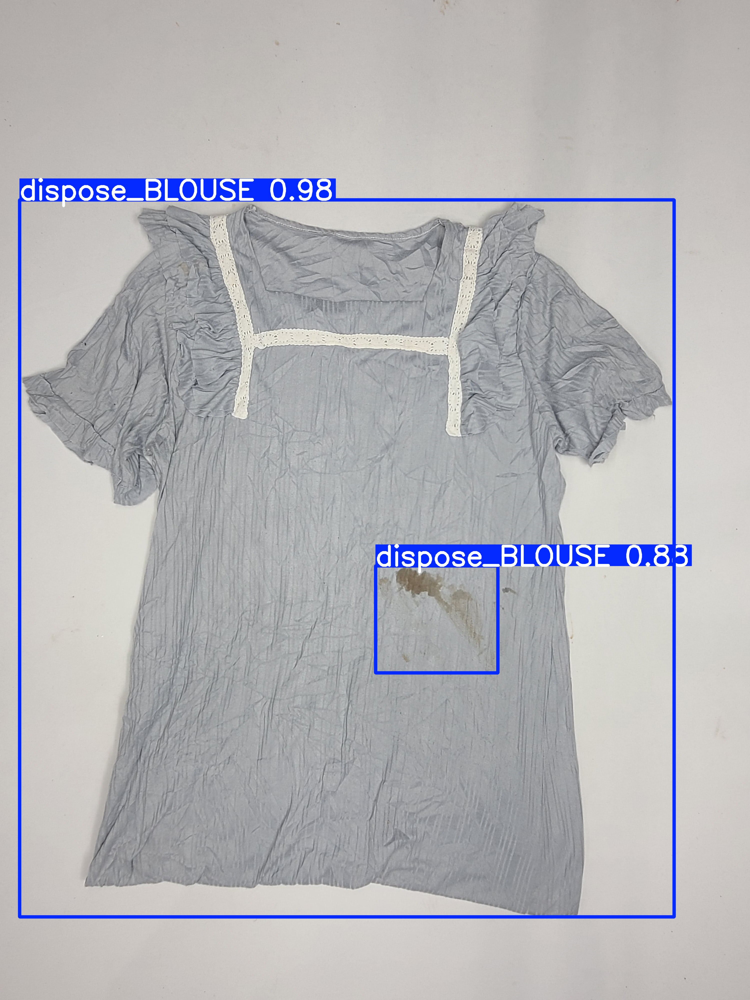

In [ ]:
# 결과 확인
for result in results:
    print(result.boxes) # 바운딩 박스
    print(result.names) # 클래스 이름
    result.show() # 시각화

# 3. 새로운 이미지를 BLIP 이미지 캡셔닝에 넣어보기

In [ ]:
# GCS 연결 (using service_key.json)
from google.colab import files
uploaded = files.upload()

In [ ]:
# 환경변수 지정
import os
service_account_json = list(uploaded.keys())[0]
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = service_account_json

# gcloud 인증
!gcloud auth activate-service-account --key-file="$GOOGLE_APPLICATION_CREDENTIALS"

NameError: name 'uploaded' is not defined

In [ ]:
# GCS 경로와 로컬 경로 지정
gcs_path = "gs://deeplearn-bucket-1/BLIP/blip_finetuned/final_model"
local_path = "/content/blip_finetuned/final_model"

# 로컬 디렉토리 생성
import os
os.makedirs(local_path, exist_ok=True)

# GCS에서 로컬로 복사
!gsutil -m cp -r {gcs_path}/* {local_path}/

ServiceException: 401 Anonymous caller does not have storage.objects.list access to the Google Cloud Storage bucket. Permission 'storage.objects.list' denied on resource (or it may not exist).
CommandException: 1 file/object could not be transferred.


In [ ]:
from transformers import BlipProcessor, BlipForConditionalGeneration
from PIL import Image
import torch
import matplotlib.pyplot as plt

# 1. 모델과 processor 로드
model_path = "/content/blip_finetuned/final_model"
model = BlipForConditionalGeneration.from_pretrained(model_path)
processor = BlipProcessor.from_pretrained(model_path)

# 2. 디바이스 설정
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
model.eval()

# 3. 예측할 이미지 경로
image_path = "/content/blip_images/DP_BL_00101.jpg"
image = Image.open(image_path).convert("RGB")

# 4. 전처리 및 캡션 생성
inputs = processor(images=image, return_tensors="pt").to(device)
with torch.no_grad():
    generated_ids = model.generate(**inputs, max_new_tokens=50)
caption = processor.decode(generated_ids[0], skip_special_tokens=True)

# 5. 시각화
plt.figure(figsize=(6, 6))
plt.imshow(image)
plt.axis("off")
plt.title(f"캡션: {caption}", fontsize=14)
plt.show()


OSError: Error no file named pytorch_model.bin, model.safetensors, tf_model.h5, model.ckpt.index or flax_model.msgpack found in directory /content/blip_finetuned/final_model.



---



# 4. Gradio UI

## 모델 준비

In [ ]:
import os
from google.cloud import storage

# 서비스 계정 키 경로 지정
os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = '/content/drive/MyDrive/dlproject-463310-0903d7003ee1.json'

# 클라이언트 생성
client = storage.Client()

bucket_name = 'deeplearn-bucket-1'

In [ ]:
!gcloud auth activate-service-account --key-file=/content/drive/MyDrive/dlproject-463310-0903d7003ee1.json

Activated service account credentials for: [48673003346-compute@developer.gserviceaccount.com]


In [ ]:
# GCS에서 YOLO best.pt 다운로드
import gcsfs
fs = gcsfs.GCSFileSystem()
gcs_path = "deeplearn-bucket-1/YOLOv8/runs_2/yolov8_train/weights/best.pt"
local_path = "/content/best.pt"
fs.get(gcs_path, local_path)
print("YOLOv8 다운로드 완료:", local_path)

# GCS에서 BLIP finetuned 모델 다운로드
!mkdir -p /content/blip_finetuned/final_model
!gsutil -m cp -r gs://deeplearn-bucket-1/BLIP/blip_finetuned/final_model/* /content/blip_finetuned/final_model/

# 필요한 라이브러리 설치
!pip install ultralytics gradio transformers accelerate --quiet

YOLOv8 다운로드 완료: /content/best.pt
Copying gs://deeplearn-bucket-1/BLIP/blip_finetuned/final_model/generation_config.json...
Copying gs://deeplearn-bucket-1/BLIP/blip_finetuned/final_model/special_tokens_map.json...
Copying gs://deeplearn-bucket-1/BLIP/blip_finetuned/final_model/model.safetensors...
Copying gs://deeplearn-bucket-1/BLIP/blip_finetuned/final_model/tokenizer_config.json...
Copying gs://deeplearn-bucket-1/BLIP/blip_finetuned/final_model/config.json...
Copying gs://deeplearn-bucket-1/BLIP/blip_finetuned/final_model/preprocessor_config.json...
==> NOTE: You are downloading one or more large file(s), which would
run significantly faster if you enabled sliced object downloads. This
feature is enabled by default but requires that compiled crcmod be
installed (see "gsutil help crcmod").

Copying gs://deeplearn-bucket-1/BLIP/blip_finetuned/final_model/tokenizer.json...
Copying gs://deeplearn-bucket-1/BLIP/blip_finetuned/final_model/vocab.txt...
| [8/8 files][944.8 MiB/944.8 MiB] 10

In [ ]:
!pip install ultralytics gradio transformers accelerate --quiet
!pip install git+https://github.com/ultralytics/ultralytics.git@main

  Cloning https://github.com/ultralytics/ultralytics.git (to revision main) to /tmp/pip-req-build-a5oq4qdk
  Running command git clone --filter=blob:none --quiet https://github.com/ultralytics/ultralytics.git /tmp/pip-req-build-a5oq4qdk
  Resolved https://github.com/ultralytics/ultralytics.git to commit adf35c24cf08930414187e1eb6ea12c485dbd8ff
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


## Gradio 실행

In [ ]:
import gradio as gr
from ultralytics import YOLO
from transformers import BlipProcessor, BlipForConditionalGeneration
from PIL import Image, ImageDraw, ImageFont
import torch

# 디바이스 설정
device = "cuda" if torch.cuda.is_available() else "cpu"

# 1) YOLO 모델 로드
yolo_model = YOLO("/content/best.pt")

# 2) BLIP 모델 & processor 로드
model_path = "/content/blip_finetuned/final_model"
blip_model = BlipForConditionalGeneration.from_pretrained(model_path)
blip_processor = BlipProcessor.from_pretrained(model_path)
blip_model.to(device)
blip_model.eval()

# YOLO 클래스 이름
class_names = {
    0: "dispose_BLOUSE",
    1: "dispose_SHIRTS",
    2: "recycle_BLOUSE",
    3: "recycle_SHIRTS",
    4: "reusable_BLOUSE",
    5: "reusable_SHIRTS"
}

# 간단하게 dispose / recycle / reusable 범주 매핑
def map_category(name):
    if "dispose" in name.lower():
        return "dispose"
    elif "recycle" in name.lower():
        return "recycle"
    elif "reusable" in name.lower():
        return "reuse"
    else:
        return "unknown"

def run_all(img: Image):
    # YOLO Object Detection
    results = yolo_model.predict(source=img, conf=0.25, iou=0.45, save=False)

    # PIL 이미지에 바운딩 박스 그리기
    img_draw = img.copy()
    draw = ImageDraw.Draw(img_draw)

    # 폰트 설정
    try:
        font = ImageFont.truetype("DejaVuSans-Bold.ttf", 18)
    except:
        font = ImageFont.load_default()

    # dispose / reuse / recycle confidence 집계용 dict
    category_scores = {"dispose": 0.0, "recycle": 0.0, "reuse": 0.0}
    category_counts = {"dispose": 0, "recycle": 0, "reuse": 0}

    detected_texts = []

    for box in results[0].boxes:
        # 좌표 (xmin, ymin, xmax, ymax)
        xyxy = box.xyxy[0].tolist()
        conf = box.conf[0].item()
        cls = int(box.cls[0].item())
        name = class_names.get(cls, "unknown")
        category = map_category(name)

        # 감지 결과 텍스트 저장
        detected_texts.append(f"{name} ({conf:.2f})")

        # 카테고리별 점수 집계
        category_scores[category] += conf
        category_counts[category] += 1

        # 박스 그리기
        draw.rectangle(xyxy, outline="red", width=2)
        text = f"{name} {conf:.2f}"

        # 텍스트 크기 계산
        bbox = draw.textbbox((0, 0), text, font=font)
        text_width = bbox[2] - bbox[0]
        text_height = bbox[3] - bbox[1]

        # 텍스트가 이미지 밖으로 나가지 않도록 위치 조정
        text_x = max(xyxy[0], 0)
        text_y = max(xyxy[1] - text_height, 0)

        # 텍스트 배경 및 글자 그리기
        draw.rectangle([text_x, text_y, text_x + text_width, text_y + text_height], fill="red")
        draw.text((text_x, text_y), text, fill="white", font=font)

    # 카테고리별 평균 confidence 계산
    category_avg_conf = {}
    for k in category_scores.keys():
        if category_counts[k] > 0:
            category_avg_conf[k] = category_scores[k] / category_counts[k]
        else:
            category_avg_conf[k] = 0.0

    # BLIP 이미지 캡션 생성
    inputs = blip_processor(images=img, return_tensors="pt").to(device)
    with torch.no_grad():
        generated_ids = blip_model.generate(**inputs, max_new_tokens=50)
    caption = blip_processor.decode(generated_ids[0], skip_special_tokens=True)

    # 결과 텍스트 생성
    category_text = "\n".join([f"{k.capitalize()}: {v*100:.1f}%" for k, v in category_avg_conf.items()])
    extra_info = f"이미지 캡션:\n{caption}"
    detected_text_summary = "\n".join(detected_texts)

    return img_draw, category_text, extra_info, detected_text_summary

# Gradio UI 구성
title = "LiClo 서비스"
description = "Recycle + Clothing 시스템  \n YOLOv8로 객체 및 오염 부분 감지를 통한 dispose/recycle/reuse 분류 + BLIP 이미지 캡션 생성까지 자동으로 실행됩니다."

iface = gr.Interface(
    fn=run_all,
    inputs=gr.Image(type="pil"),
    outputs=[
        gr.Image(type="pil", label="객체 감지 결과 이미지"),
        gr.Textbox(label="dispose / reuse / recycle 확률", lines=4),
        gr.Textbox(label="이미지 캡션"),
        gr.Textbox(label="클래스별 감지 결과", lines=10)
    ],
    title=title,
    description=description,
    flagging_mode="never"
)

iface.launch(share=True, debug=True)

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://9f715d040f551bd44b.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)



0: 640x640 1 reusable_BLOUSE, 228.5ms
Speed: 8.1ms preprocess, 228.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 reusable_SHIRTS, 199.6ms
Speed: 6.2ms preprocess, 199.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 reusable_BLOUSE, 215.0ms
Speed: 5.6ms preprocess, 215.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7861 <> https://9f715d040f551bd44b.gradio.live
